In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage import io, img_as_float, img_as_ubyte
from skimage.util import random_noise

# Наложение и удаление шума

In [46]:
image = cv2.imread('sar_1.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) 

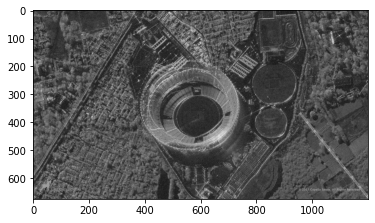

In [47]:
plt.imshow(image_gray, cmap="gray")

In [81]:
# Gaussian noise
mean = 0
stddev = 100
noise_gauss = np.zeros(image_gray.shape, np.uint8)
cv2.randn(noise_gauss, mean, stddev)

array([[229,   0,   0, ...,   0,   0,   0],
       [126,  68,   0, ...,   0,   0,  32],
       [162,  11,   6, ...,  13,  50,   0],
       ...,
       [  0,   6, 141, ...,   0,   0, 105],
       [ 26,   0,   0, ...,  54,  99,   0],
       [ 30,   0,  14, ...,   0,  84,   0]], dtype=uint8)

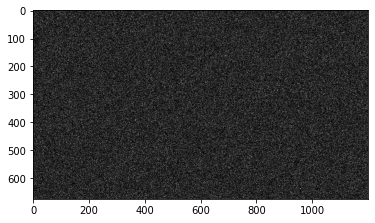

In [82]:
plt.imshow(noise_gauss, cmap="gray")

In [83]:
# Salt and pepper
noise =  np.random.randint(0, 101, size = (image_gray.shape[0], image_gray.shape[1]), dtype=int)
zeros_pixel = np.where(noise == 0)
ones_pixel = np.where(noise == 100)

In [84]:
bg_image = np.ones(image_gray.shape, np.uint8) * 128

In [85]:
bg_image[zeros_pixel] = 0
bg_image[ones_pixel] = 255

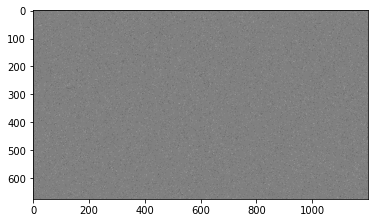

In [86]:
plt.imshow(bg_image, cmap="gray")

In [87]:
image_noise_gauss = cv2.add(image_gray,noise_gauss)

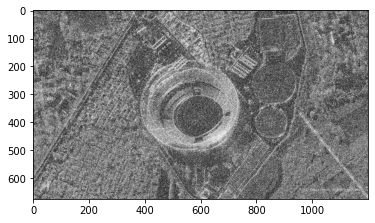

In [88]:
plt.imshow(image_noise_gauss, cmap="gray")

In [89]:
from skimage.metrics import structural_similarity, mean_squared_error
mse_gauss = mean_squared_error(image_gray, image_noise_gauss)
(ssim, diff) = structural_similarity(image_gray, image_noise_gauss, full=True)
print(mse_gauss, ssim)

4239.23434691358 0.18694949978788222


In [90]:
image_gauss_median = cv2.medianBlur(image_noise_gauss, 3)

In [91]:
mse_gauss_median = mean_squared_error(image_gray, image_gauss_median)
(ssim_gauss_median, diff) = structural_similarity(image_gray,  image_gauss_median, full=True)

In [92]:
print(mse_gauss_median, ssim_gauss_median)

1034.030974074074 0.42729854374617976


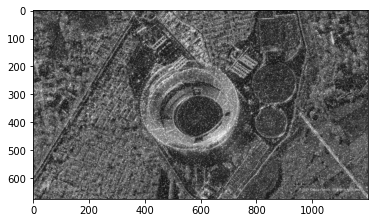

In [93]:
plt.imshow(image_gauss_median, cmap="gray")

In [94]:
import copy

image_sp = copy.deepcopy(image_gray)

image_sp[zeros_pixel] = 0
image_sp[ones_pixel] = 255

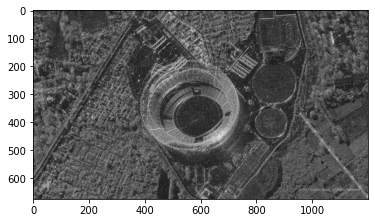

In [95]:
plt.imshow(image_sp, cmap="gray")

In [96]:
mse_sp = mean_squared_error(image_gray, image_sp)
(ssim_sp, diff) = structural_similarity(image_gray, image_sp, full=True)
print(mse_sp, ssim_sp)

387.02924320987654 0.7229272028218258


In [101]:
image_sp_median = cv2.medianBlur(image_sp, 3)

In [102]:
mse_sp_median = mean_squared_error(image_gray, image_sp_median)
(ssim_sp_median, diff) = structural_similarity(image_gray, image_sp_median, full=True)
print(mse_sp_median, ssim_sp_median)

95.94404444444444 0.8160796293211554


# Другие типы фильтров

In [131]:
image_gauss_gauss = cv2.GaussianBlur(image_noise_gauss,(5,5),0)

In [133]:
image_gauss_bilat = cv2.bilateralFilter(image_noise_gauss,9,75,75)

In [139]:
image_gauss_nlm = cv2.fastNlMeansDenoising(image_noise_gauss, h = 20)

In [147]:
import math

def geom(a):
    prod = 1
    for i in range(a.shape[0]):
        prod1 = 1
        for j in range(a.shape[1]):
            prod1 *= a[i,j]
        prod1 = math.pow(prod1, 1.0/9.0)
        prod *= prod1
    return prod

def proc(img, filter):
    img_res = copy.deepcopy(img)
    for i in range(0,img.shape[0] -2):
        for j in range(0,img.shape[1] -2):
            img_res[i:i+3, j:j+3] = filter(img[i:i+3, j:j+3])
    return img_res
    
res = proc(image_noise_gauss, geom)


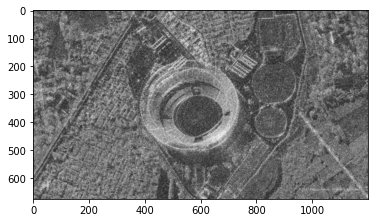

In [148]:
plt.imshow(res, cmap="gray")

In [149]:
mse_geom = mean_squared_error(image_gray, res)
(ssim_geom, diff) = structural_similarity(image_gray, res, full=True)
print(mse_geom, ssim_geom)

1219.7879691358025 0.3984170557811386



# 2D свертка

In [105]:
# averaging filter
kernel_5 = np.ones((5,5),np.float32)/25
image_k5 = cv2.filter2D(image_gray,-1,kernel_5)
# blured_image = cv2.blur(img,(5,5))
image_b5 = cv2.blur(image_gray,(5,5))

In [106]:
mse_kb = mean_squared_error(image_k5, image_b5)
(ssim_kb, diff) = structural_similarity(image_k5, image_b5, full=True)
print(mse_kb, ssim_kb)

0.0 1.0


In [127]:
# Laplasian
kernel_lapl = np.array([[0,-10,0],
                        [-10,40,-10],
                        [0,-10,0]], np.float32)

In [128]:
image_lapl = cv2.filter2D(image_gray,-1,kernel_lapl) 

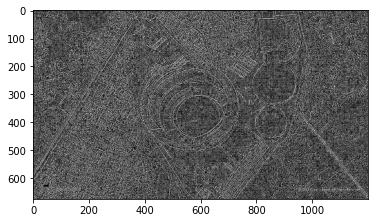

In [129]:
plt.imshow(image_lapl, cmap="gray")

In [4]:
# ДЗ 2
# Зашумить изображение при помощи шума гаусса, постоянного шума.
# Протестировать медианный фильтр, фильтр гаусса, билатериальный фильтр, фильтр нелокальных средних с различными параметрами.
# Выяснить, какой фильтр показал лучший результат фильтрации шума.

In [26]:
from skimage import io, img_as_float, img_as_ubyte
from skimage.util import random_noise
from skimage.restoration import denoise_nl_means, estimate_sigma
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (10, 6)

def show_img(img, title=""):
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()

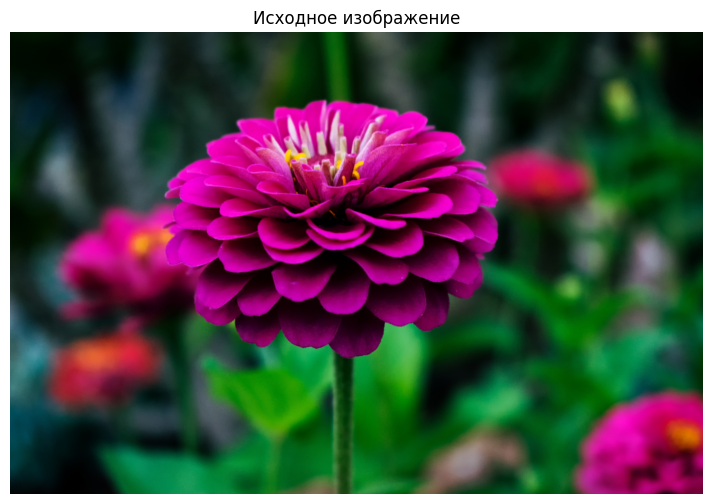

In [27]:
# Заменяй "img.jpg" на своё имя файла при необходимости
img = img_as_float(io.imread("img.jpg"))

show_img(img, "Исходное изображение")


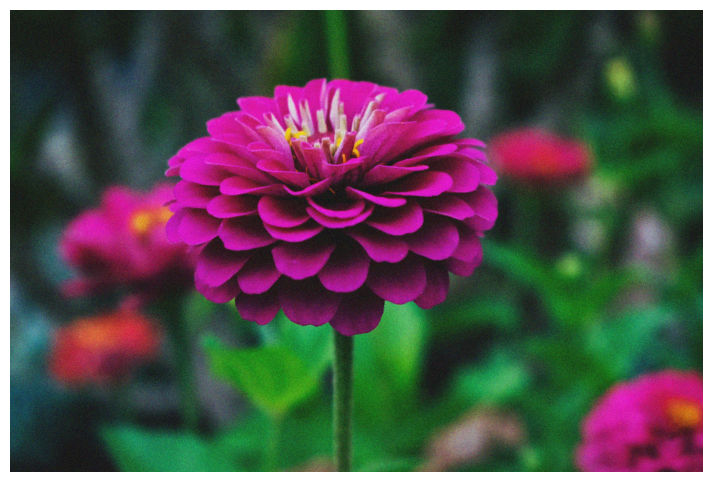

In [29]:

sigma_gauss = 0.25  
gauss_noisy = random_noise(img, mode='gaussian', var=sigma_gauss**2)

show_img(gauss_noisy)



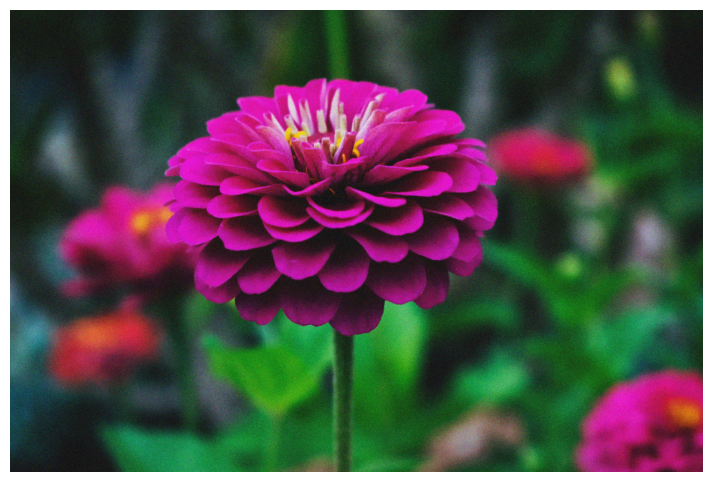

In [31]:

a = 0.35  
uniform_noise = np.random.uniform(-a, a, img.shape)
const_noisy = np.clip(img + uniform_noise, 0, 1)

show_img(const_noisy)



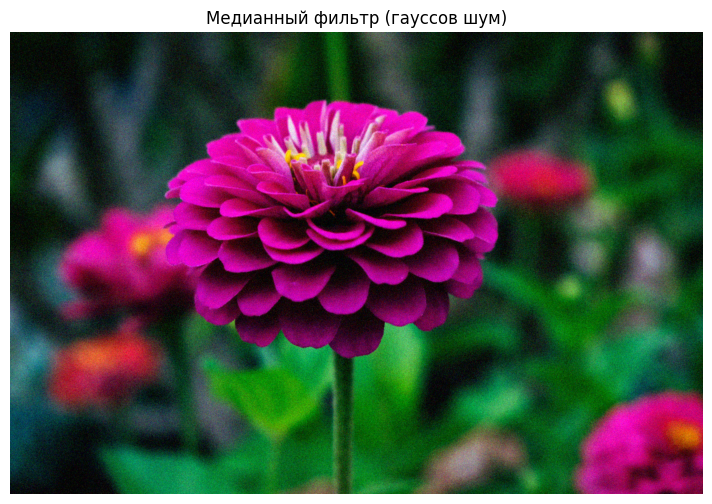

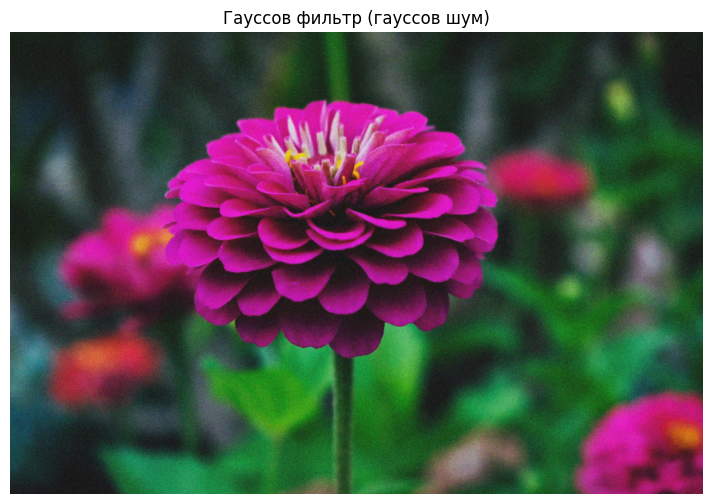

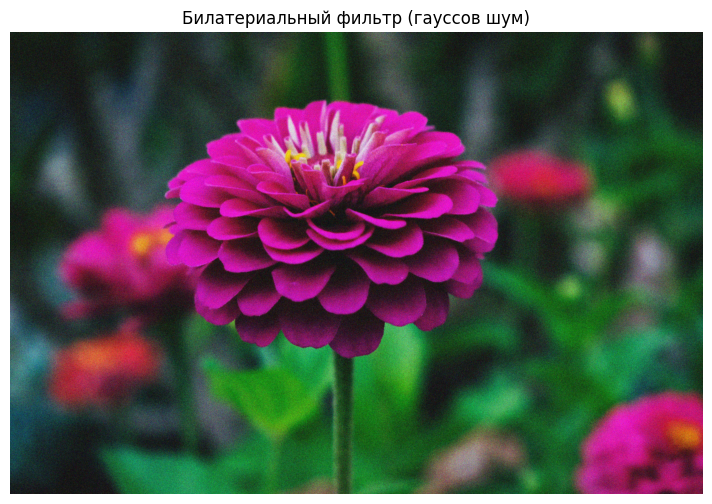

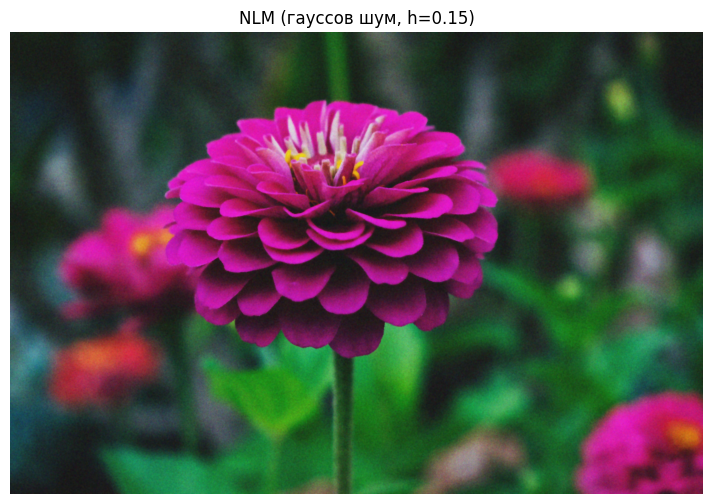

In [34]:
gauss_noisy_u8 = img_as_ubyte(gauss_noisy)

median_gauss = cv2.medianBlur(gauss_noisy_u8, 5)
show_img(median_gauss, "Медианный фильтр (гауссов шум)")

gauss_filter_gauss = cv2.GaussianBlur(gauss_noisy_u8, (9, 9), 1.5)
show_img(gauss_filter_gauss, "Гауссов фильтр (гауссов шум)")


bil_gauss = cv2.bilateralFilter(gauss_noisy_u8, 9, 50, 50)
show_img(bil_gauss, "Билатериальный фильтр (гауссов шум)")


h_nlm_gauss = 0.15

nlm_gauss = denoise_nl_means(
    gauss_noisy,
    h=h_nlm_gauss,
    fast_mode=True,
    patch_size=5,
    patch_distance=6,
    channel_axis=2
)

show_img(nlm_gauss, f"NLM (гауссов шум, h={h_nlm_gauss})")


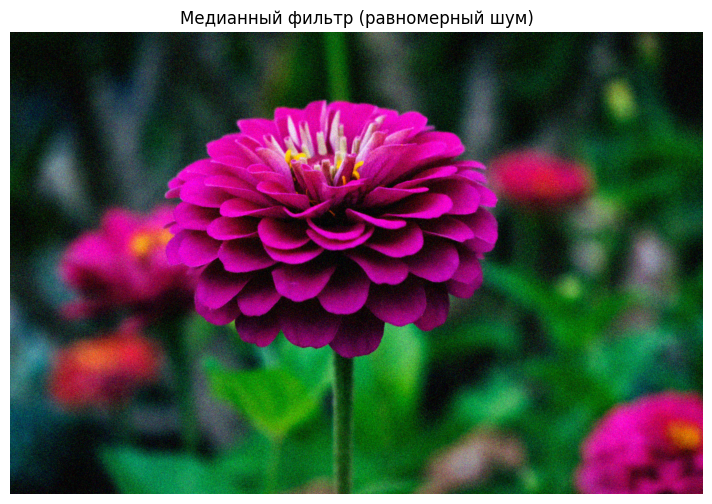

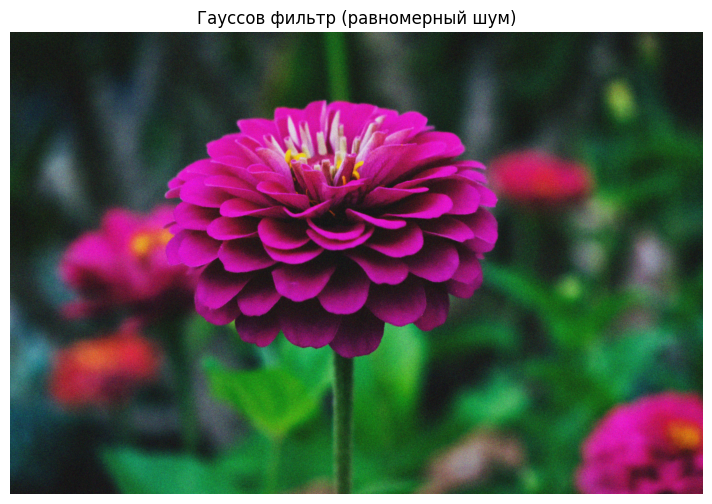

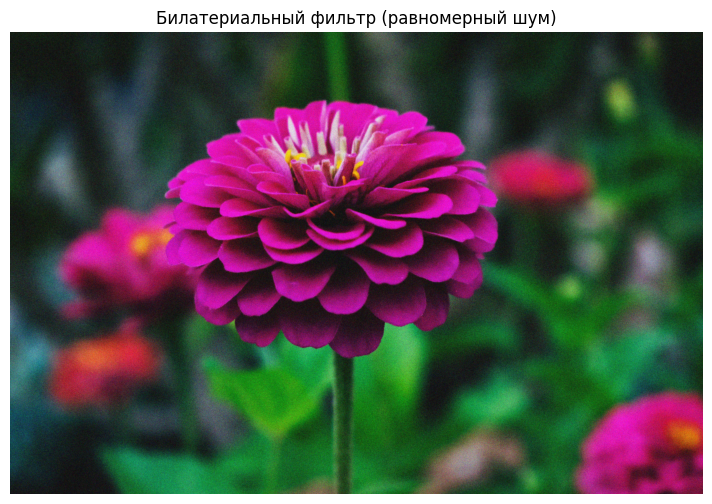

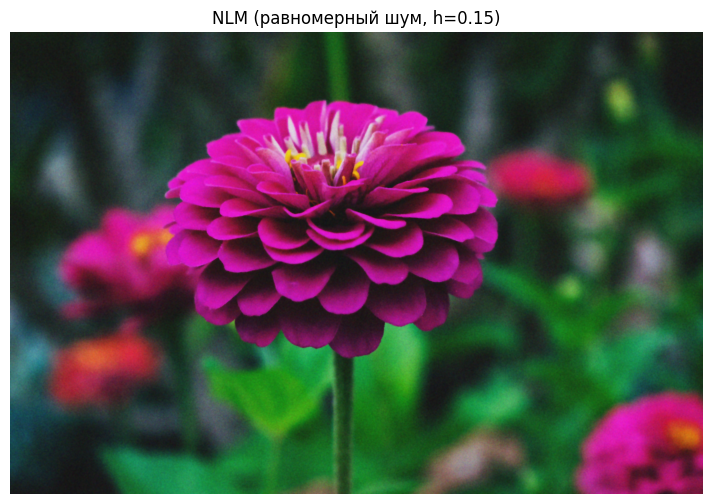

In [35]:

const_noisy_u8 = img_as_ubyte(const_noisy)

median_const = cv2.medianBlur(const_noisy_u8, 5)
show_img(median_const, "Медианный фильтр (равномерный шум)")

gauss_filter_const = cv2.GaussianBlur(const_noisy_u8, (9, 9), 1.5)
show_img(gauss_filter_const, "Гауссов фильтр (равномерный шум)")

bil_const = cv2.bilateralFilter(const_noisy_u8, 9, 50, 50)
show_img(bil_const, "Билатериальный фильтр (равномерный шум)")

h_nlm_const = 0.15

nlm_const = denoise_nl_means(
    const_noisy,
    h=h_nlm_const,
    fast_mode=True,
    patch_size=5,
    patch_distance=6,
    channel_axis=2
)

show_img(nlm_const, f"NLM (равномерный шум, h={h_nlm_const})")


In [36]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity


In [42]:
def evaluate(original, processed):
    psnr = peak_signal_noise_ratio(original, processed, data_range=1.0)
    ssim = structural_similarity(original, processed, channel_axis=2, data_range=1.0)
    return psnr, ssim


In [43]:
results_gauss = {
    "median":  evaluate(img, img_as_float(median_gauss)),
    "gaussian": evaluate(img, img_as_float(gauss_filter_gauss)),
    "bilateral": evaluate(img, img_as_float(bil_gauss)),
    "nlm": evaluate(img, nlm_gauss)
}

results_gauss


{'median': (np.float64(24.605182279484747), np.float64(0.2884536604747226)),
 'gaussian': (np.float64(23.06361520608536), np.float64(0.37977561277894517)),
 'bilateral': (np.float64(15.493805558562968),
  np.float64(0.04095213516260567)),
 'nlm': (np.float64(23.964977852314583), np.float64(0.4756417971918569))}

In [48]:
results_const = {
    "median":  evaluate(img, img_as_float(median_const)),
    "gaussian": evaluate(img, img_as_float(gauss_filter_const)),
    "bilateral": evaluate(img, img_as_float(bil_const)),
    "nlm": evaluate(img, nlm_const)
}

results_const


{'median': (np.float64(23.979290908734498), np.float64(0.26102853140715476)),
 'gaussian': (np.float64(24.560596134105346), np.float64(0.4343946620853149)),
 'bilateral': (np.float64(17.484154916196918),
  np.float64(0.06351326270778934)),
 'nlm': (np.float64(25.54884568024997), np.float64(0.5764220397250904))}

In [49]:
def best_filter(results):
    best_name = max(results, key=lambda k: results[k][1])
    psnr, ssim = results[best_name]
    return best_name, psnr, ssim

best_g, psnr_g, ssim_g = best_filter(results_gauss)
best_c, psnr_c, ssim_c = best_filter(results_const)

print("Лучший фильтр для ГАУССОВА шума:")
print(f"{best_g.upper()}  (PSNR={psnr_g:.3f}, SSIM={ssim_g:.3f})")

print("\nЛучший фильтр для РАВНОМЕРНОГО шума:")
print(f"{best_c.upper()}  (PSNR={psnr_c:.3f}, SSIM={ssim_c:.3f})")


Лучший фильтр для ГАУССОВА шума:
NLM  (PSNR=23.965, SSIM=0.476)

Лучший фильтр для РАВНОМЕРНОГО шума:
NLM  (PSNR=25.549, SSIM=0.576)
